In [30]:
import numpy as np
import pandas as pd
np.set_printoptions(precision=5, suppress=True)
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
import pickle
import os
from scipy import stats
import seaborn as sns
from methods import *
import glob
import umap
from sklearn.metrics import silhouette_score
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")
print('done')

done


In [2]:
%load_ext autoreload
%autoreload 2

# Read data

In [4]:
# path_csv = r'confusion-reports\ics_svm\round3-train-dataset\round3-train-dataset_square-30-filters_all-classes_gray.csv'
path_csv = fr'confusion-reports\ics_fc\round3-train-dataset\round3-train-dataset_fc_square-30-random_filters.csv'
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
X.shape

Using diffs


(1008, 20)

# T-SNE 2D & 3D

Using diffs
p=0


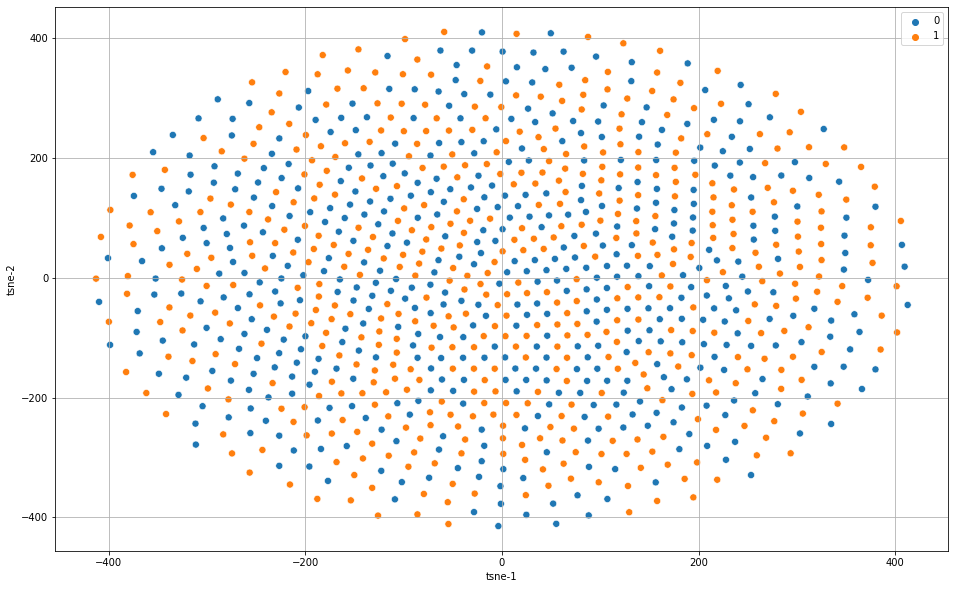

p=5


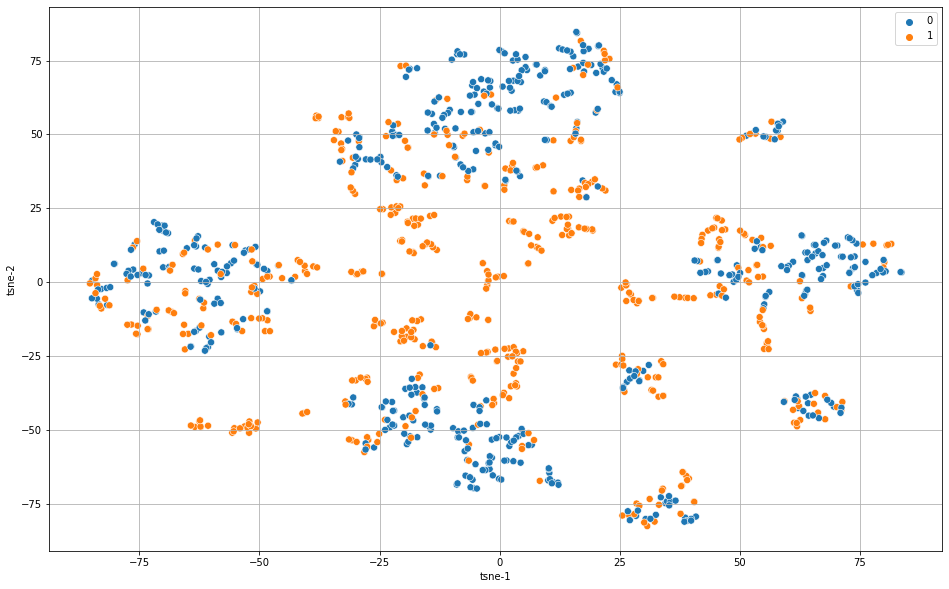

p=10


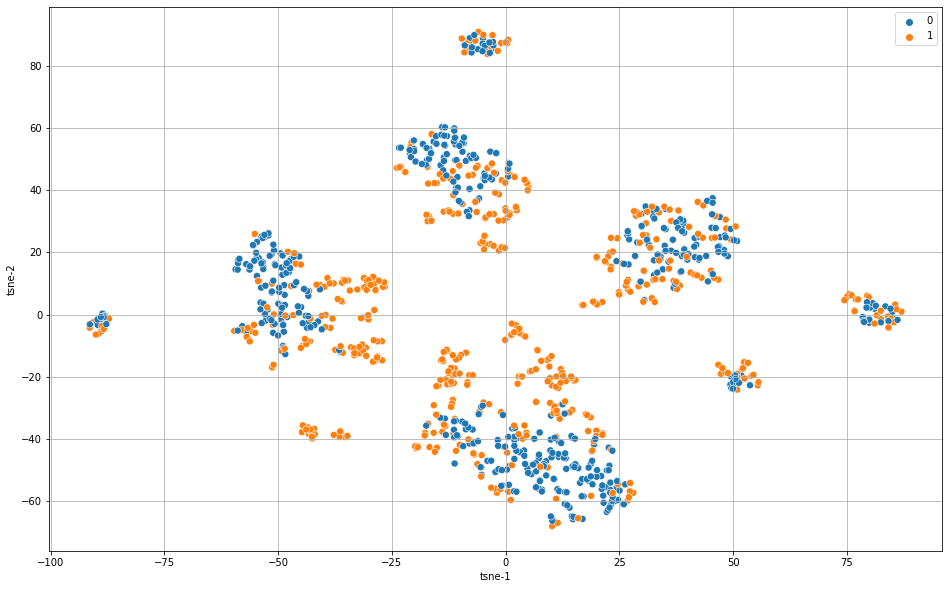

p=15


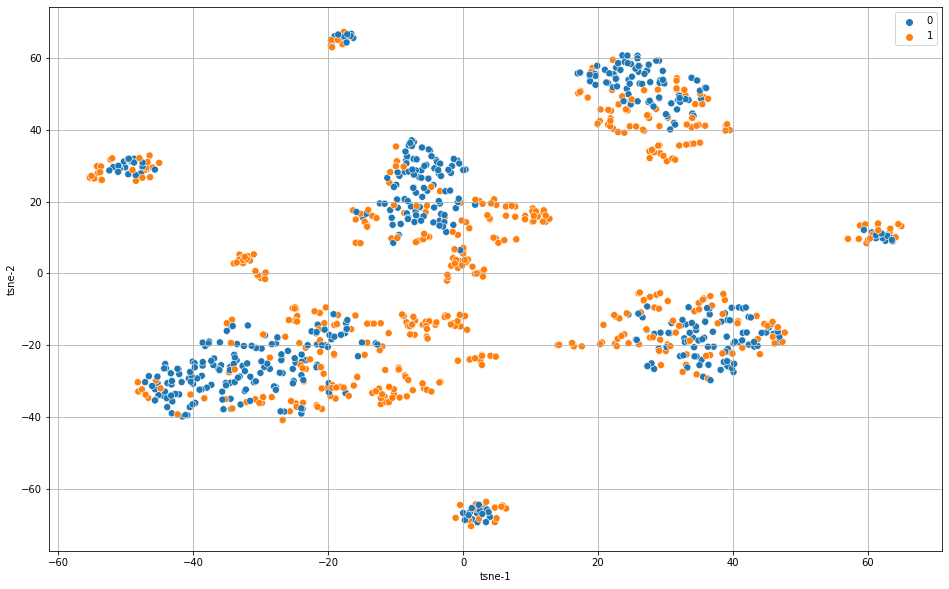

p=20


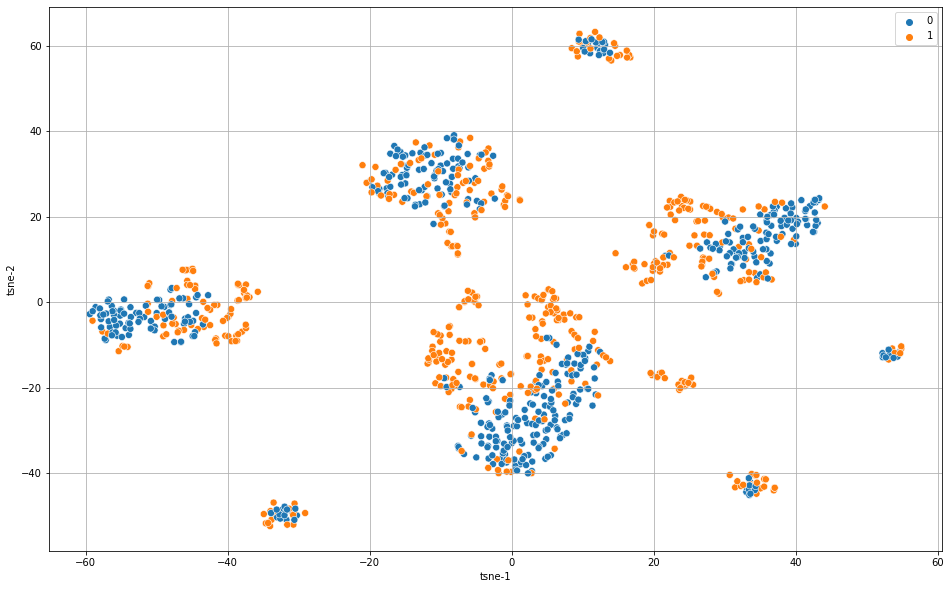

p=25


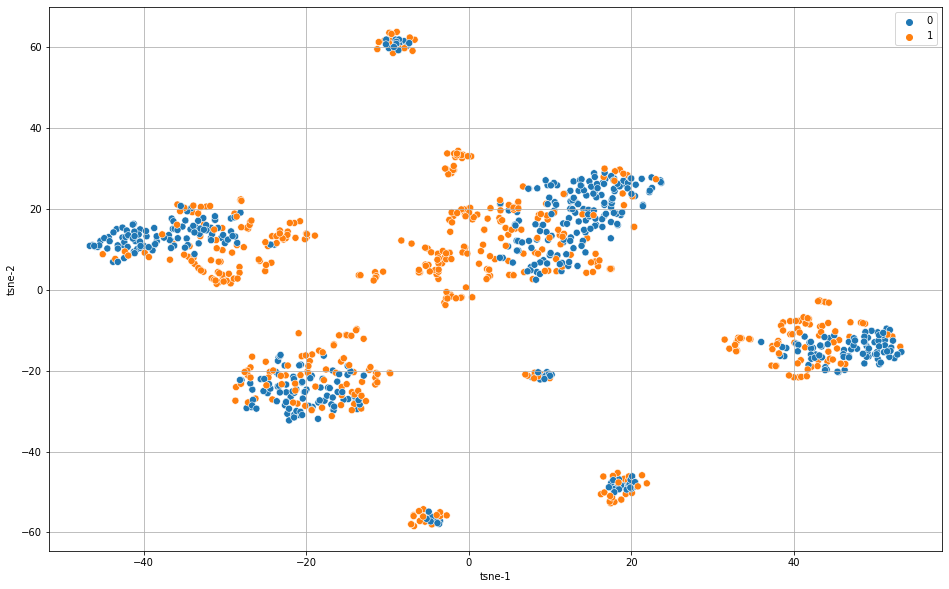

p=30


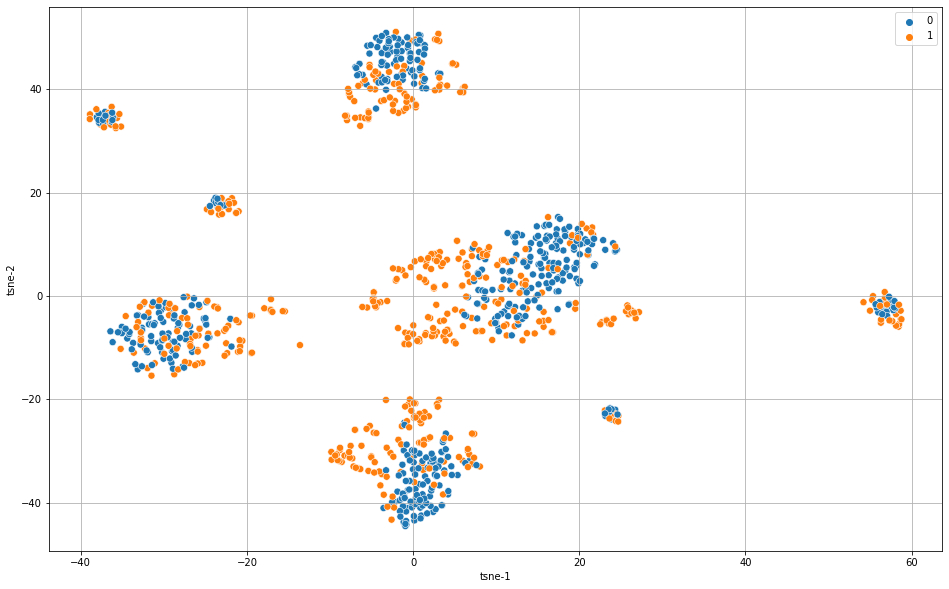

p=35


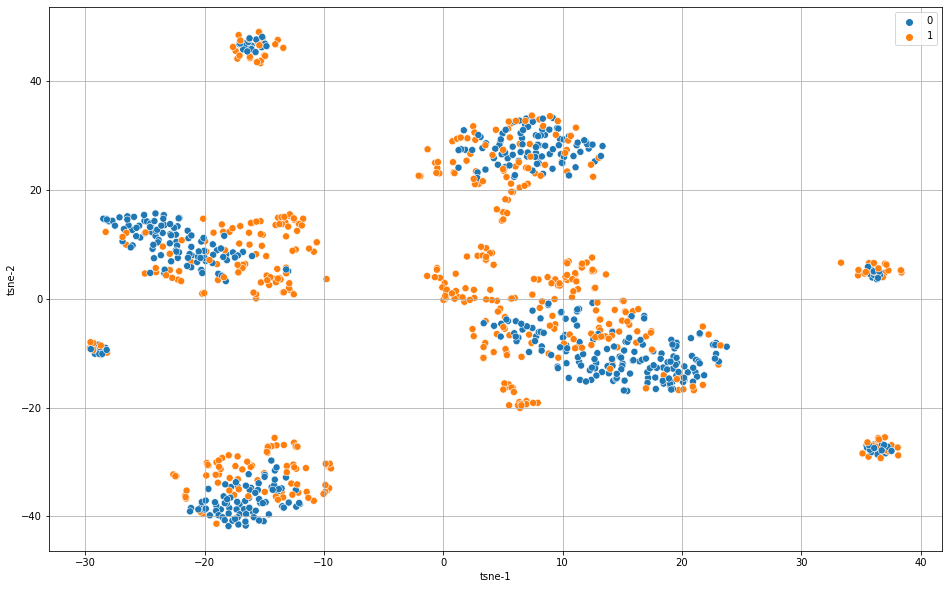

p=40


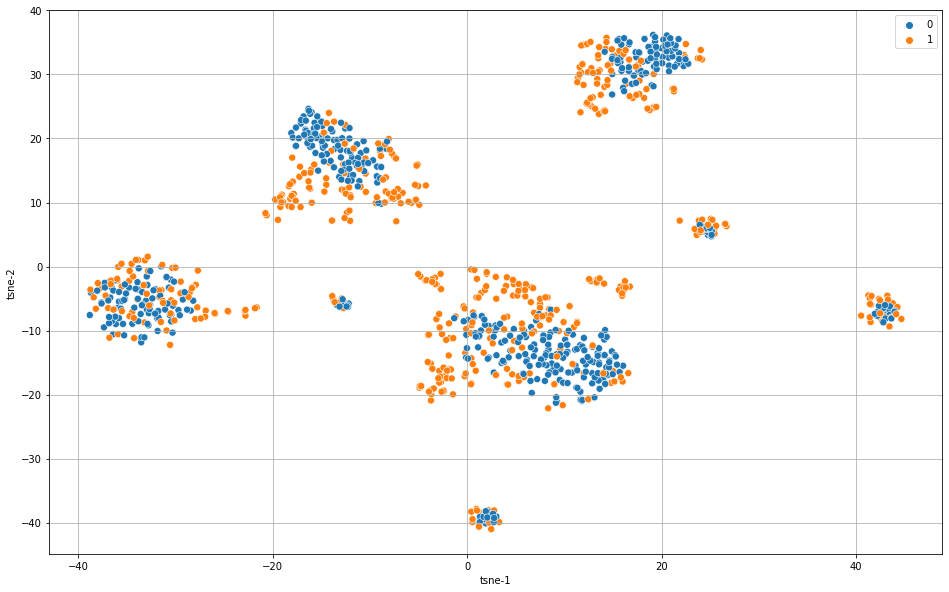

p=45


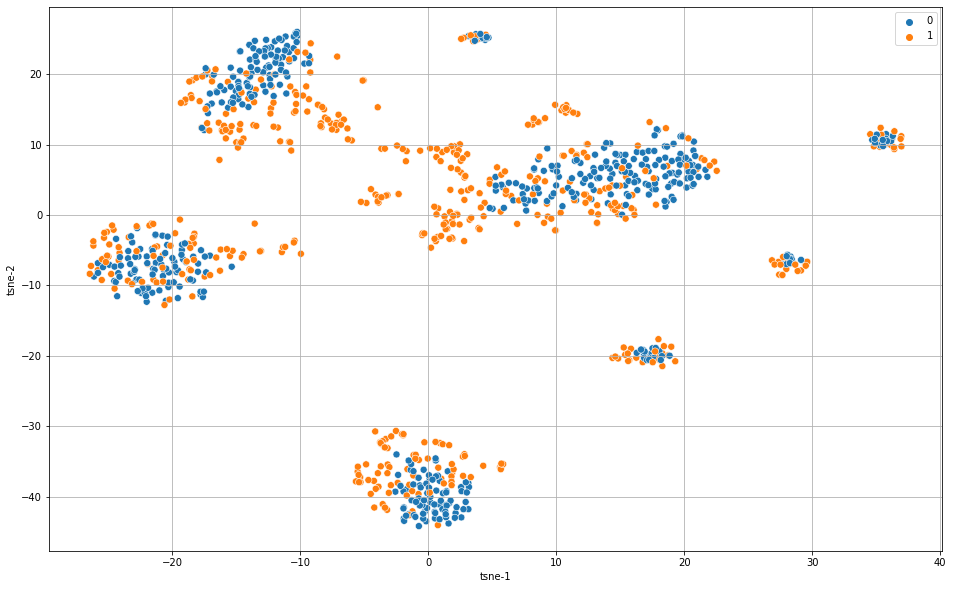

p=50


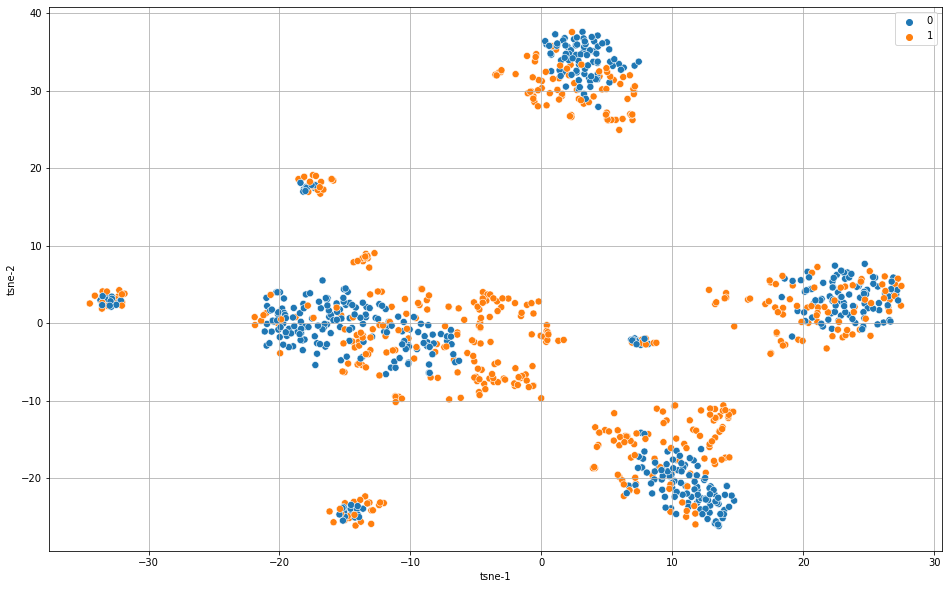

p=55


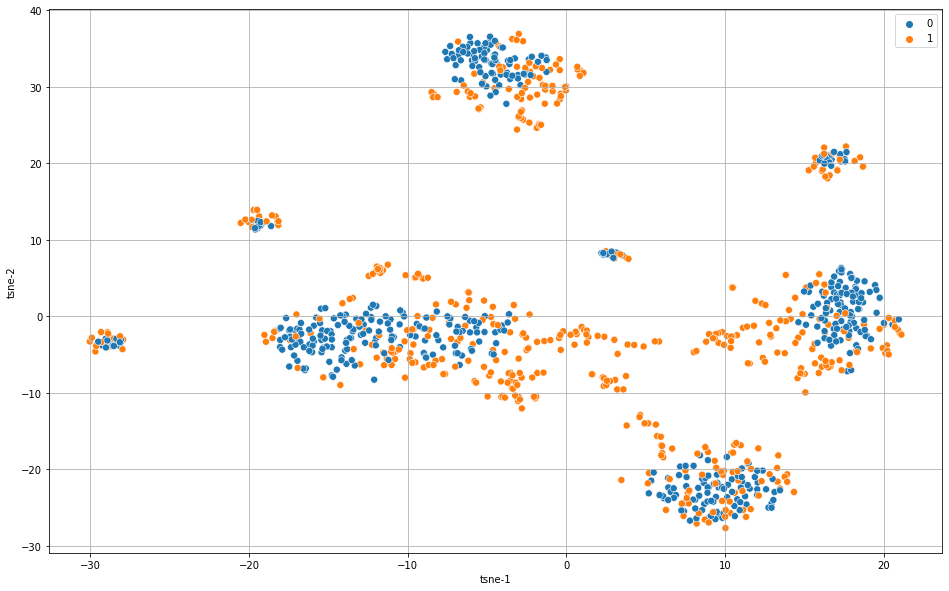

p=60


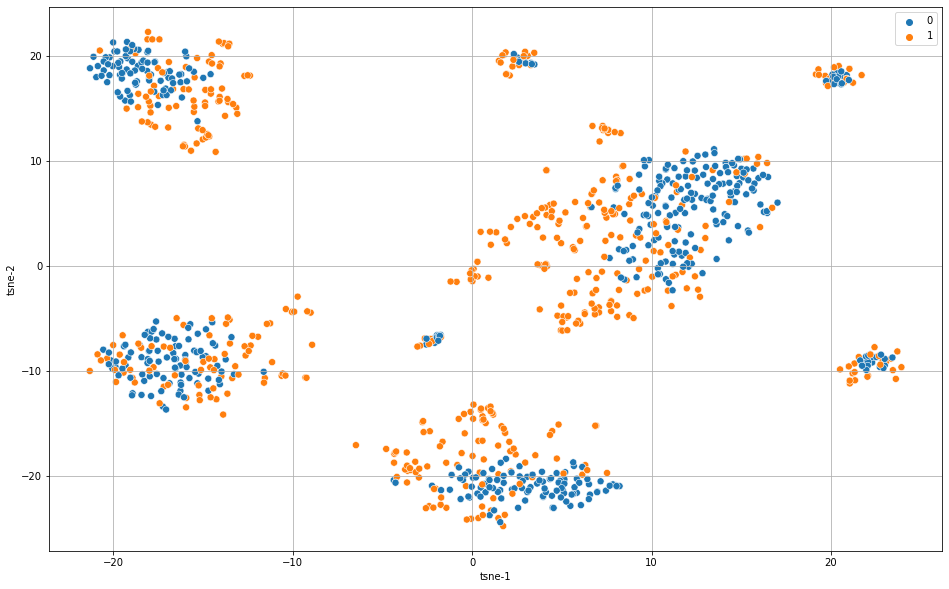

p=65


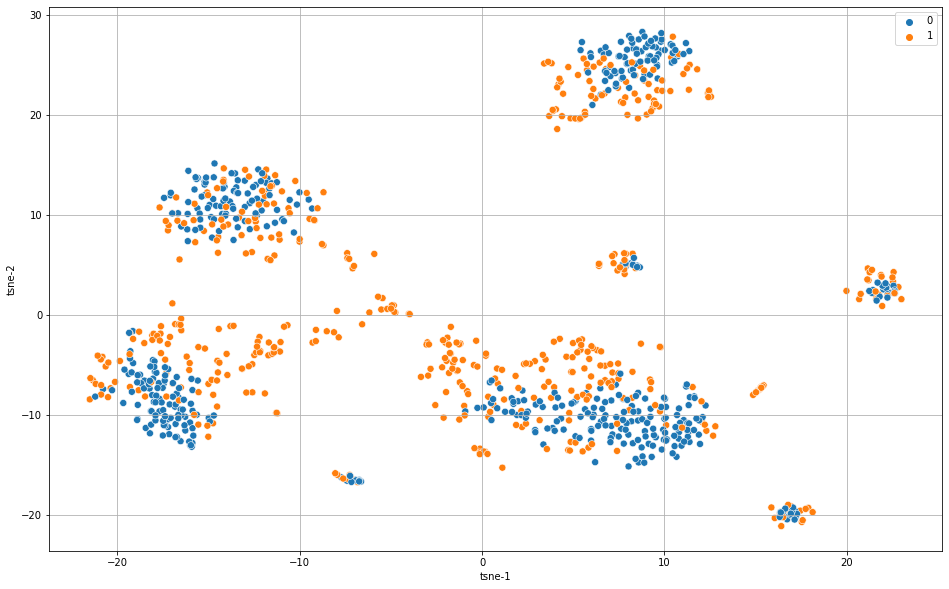

p=70


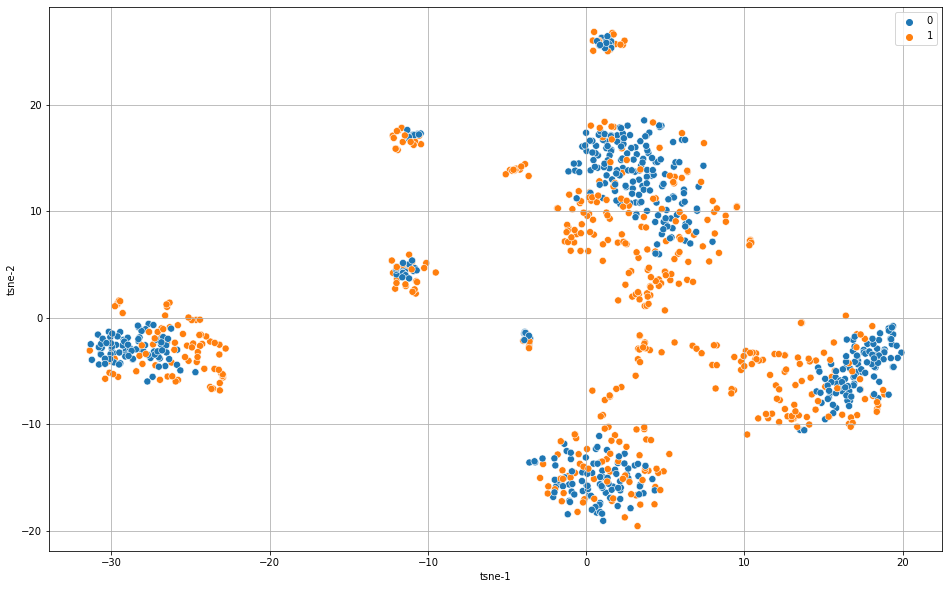

p=75


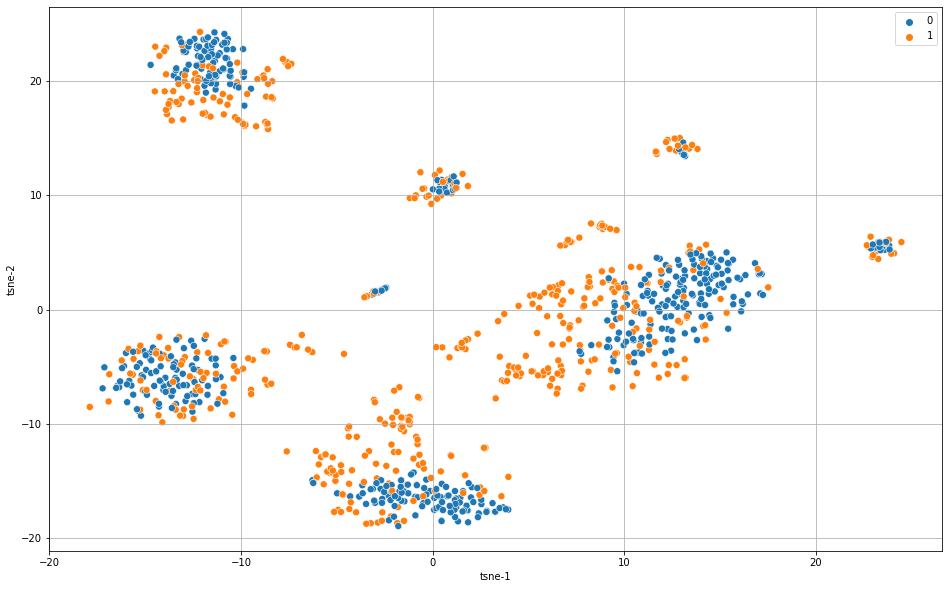

p=80


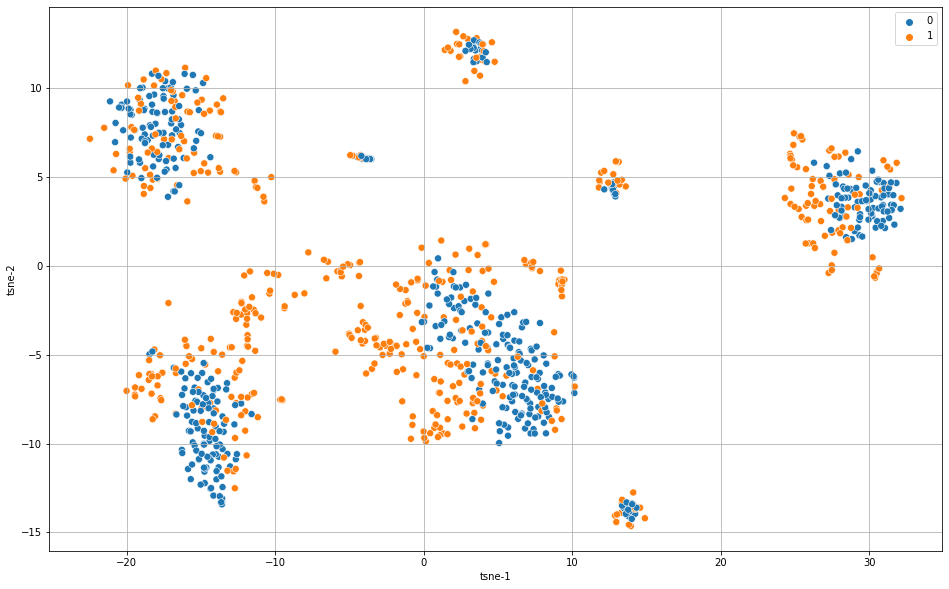

p=85


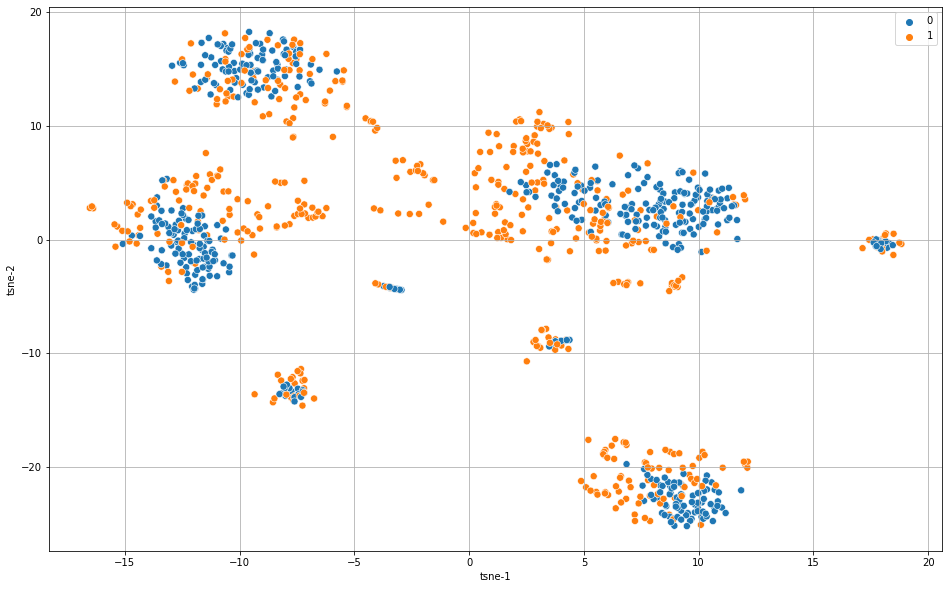

p=90


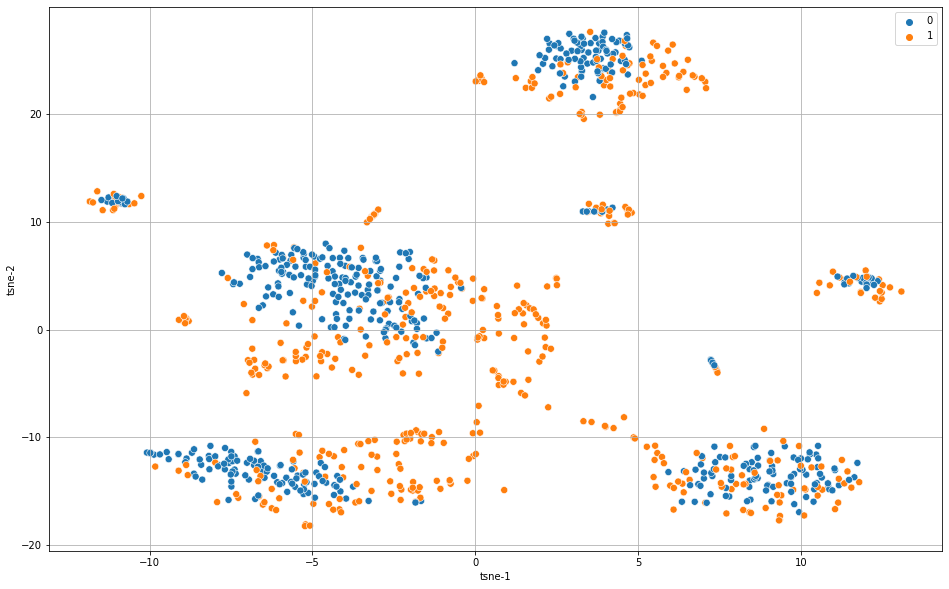

p=95


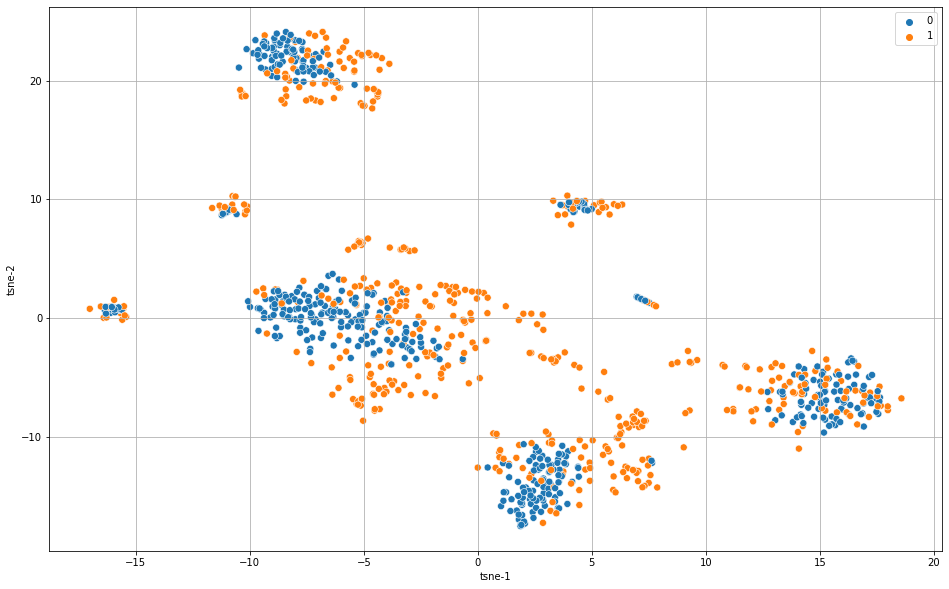

p=100


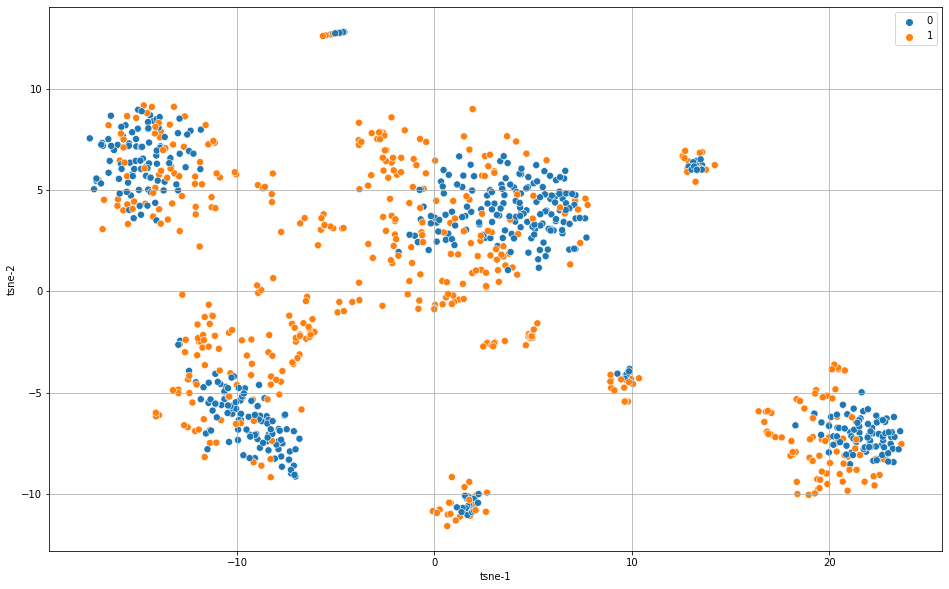

In [6]:
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
# X = X[:,:4]
X_scaled = StandardScaler().fit_transform(X)
# X_scaled = np.copy(X)
target = y
for p in range(0, 101, 5):
    print(f'p={p}')
    X_tsne_2D = TSNE(n_components=2,
                     perplexity=p,
                     n_iter=1000,
                     learning_rate=200,
                     n_jobs=-1).fit_transform(X_scaled)
    # X_tsne_3D = TSNE(n_components=3).fit_transform(X_scaled)

    plot2D(X_tsne_2D, x='tsne-1', y='tsne-2', labels=target)
#     plot3D(X_tsne_3D, x='tsne-1', y='tsne-2', z='tsne-3', labels=target)

# UMAP 2D & 3D

Using diffs
(1008, 20)
min_dist=10
(1008, 2)


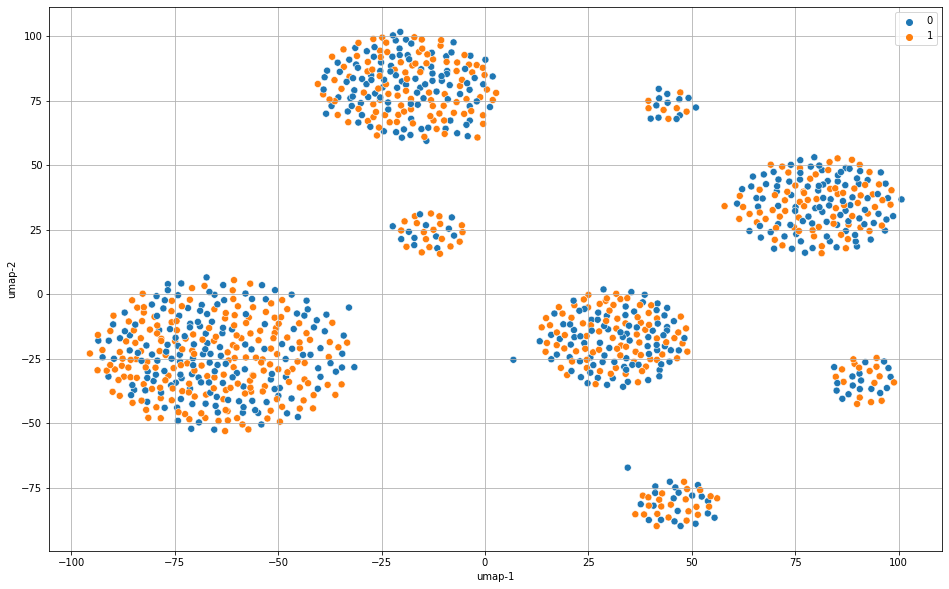

In [28]:
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
# X_scaled = StandardScaler().fit_transform(X)
X_scaled = np.copy(X)
print(X.shape)
target = y
# for n_neighbors in [2] + list(range(5, 51, 5)):
for min_dist in [10]: # [0.001, 0.01, 0.1, 0.5, 1, 2, 3, 4, 5, 6, 7, 8, 9]:
#     print(f'n_neighbors={n_neighbors}')
    print(f'min_dist={min_dist}')
    X_umap_2D = umap.UMAP(n_components=2,
                          n_neighbors=5,
                          min_dist=min_dist,
                          spread=20,
                          metric='jaccard').fit_transform(X_scaled)
    print(X_umap_2D.shape)
    plot2D(X_umap_2D, x='umap-1', y='umap-2', labels=target)

Using diffs
(1008, 20) (1008,)
euclidean


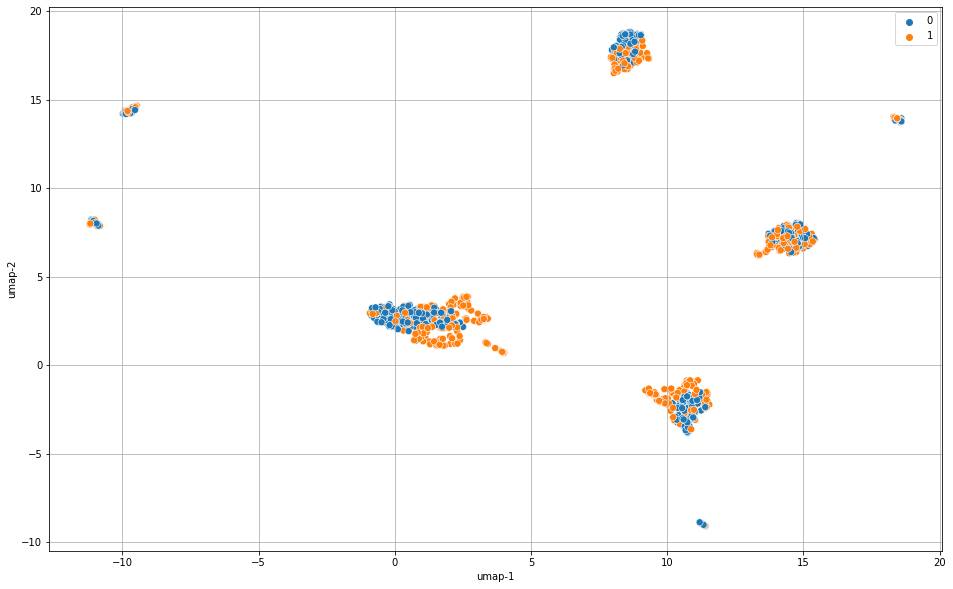

----------------------------------------------------------------------------
manhattan


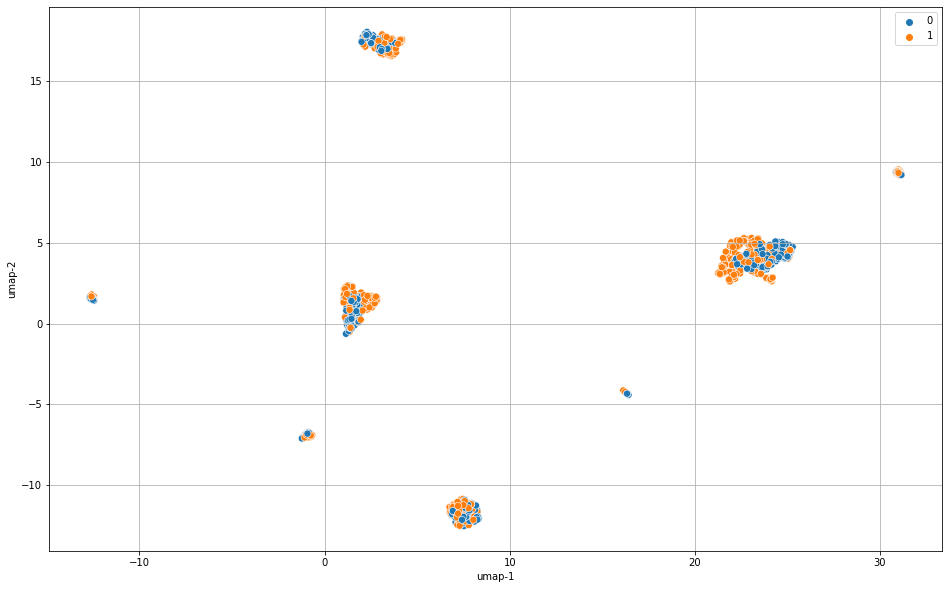

----------------------------------------------------------------------------
chebyshev


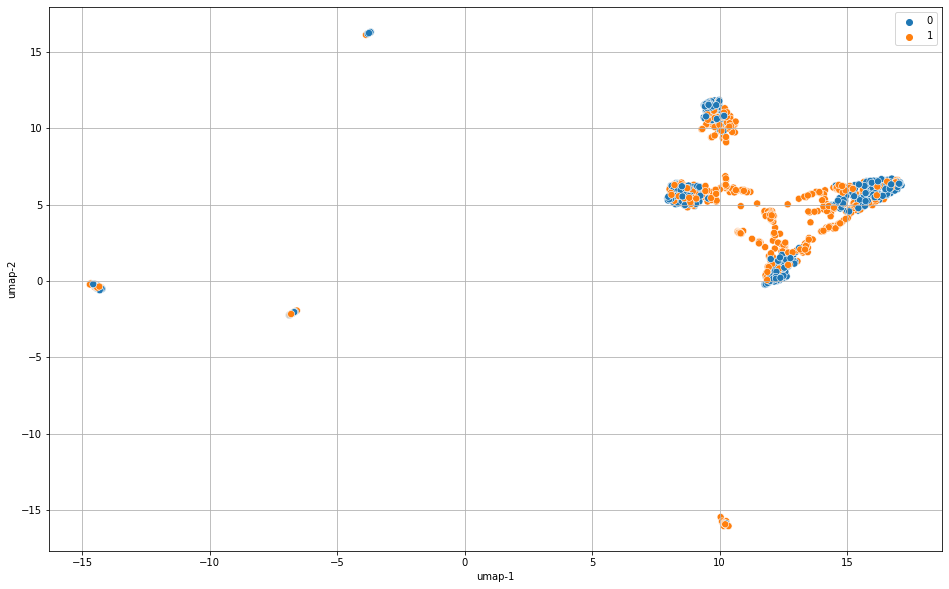

----------------------------------------------------------------------------
minkowski


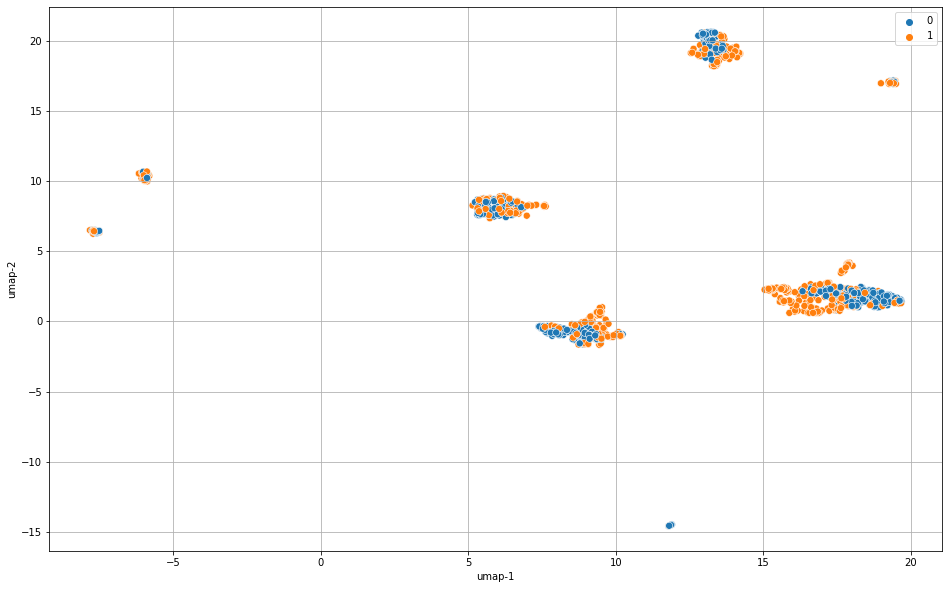

----------------------------------------------------------------------------
canberra


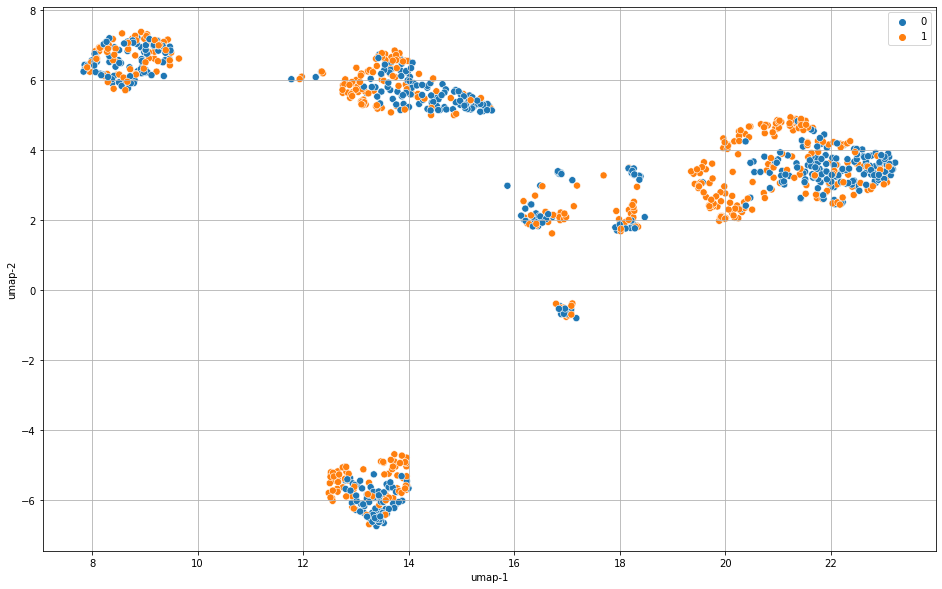

----------------------------------------------------------------------------
braycurtis


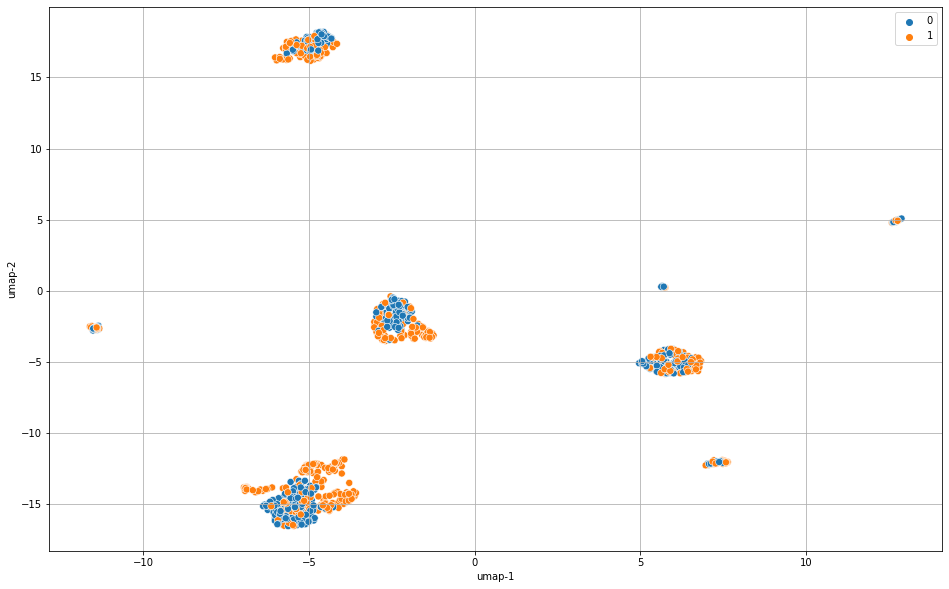

----------------------------------------------------------------------------
mahalanobis


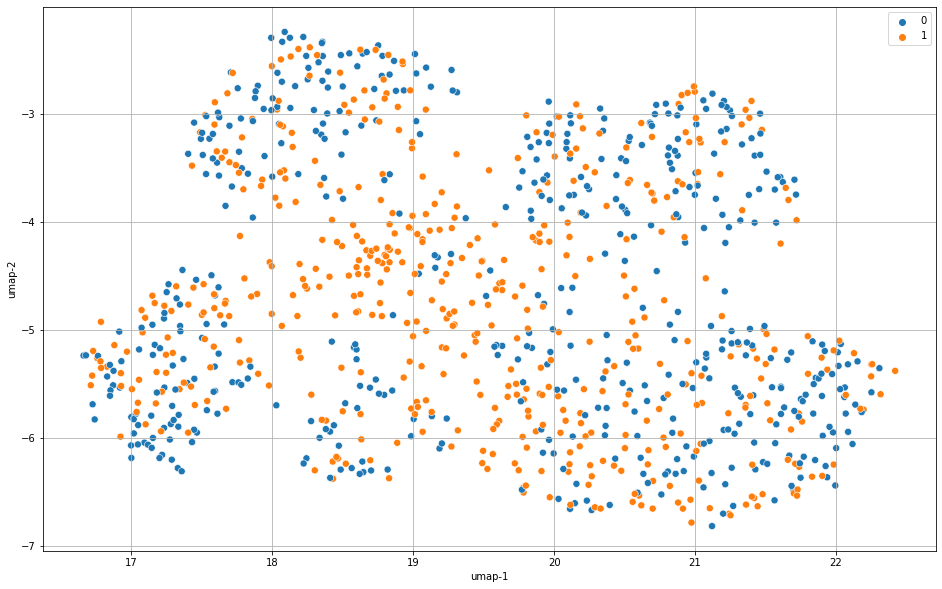

----------------------------------------------------------------------------
wminkowski


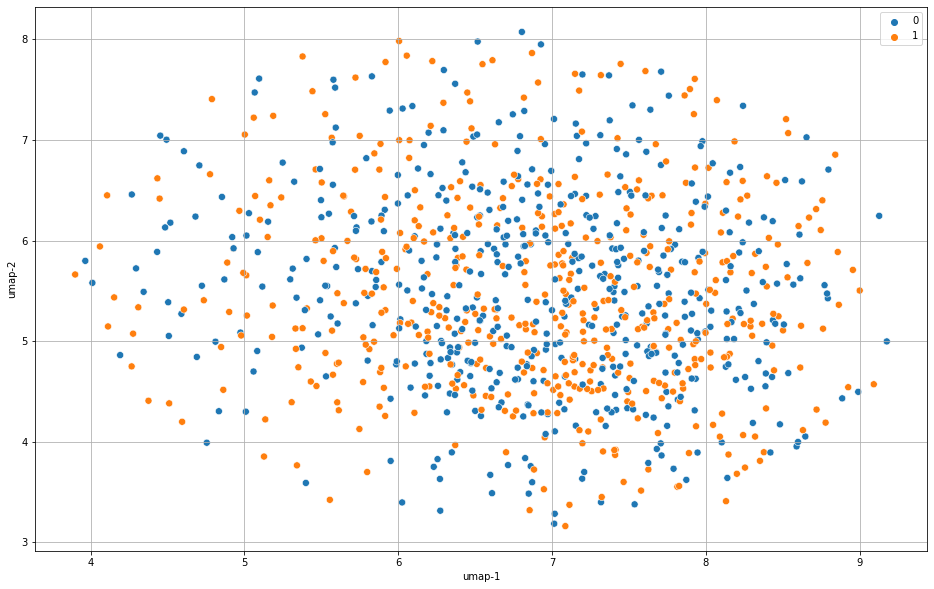

----------------------------------------------------------------------------
seuclidean
division by zero
----------------------------------------------------------------------------
cosine


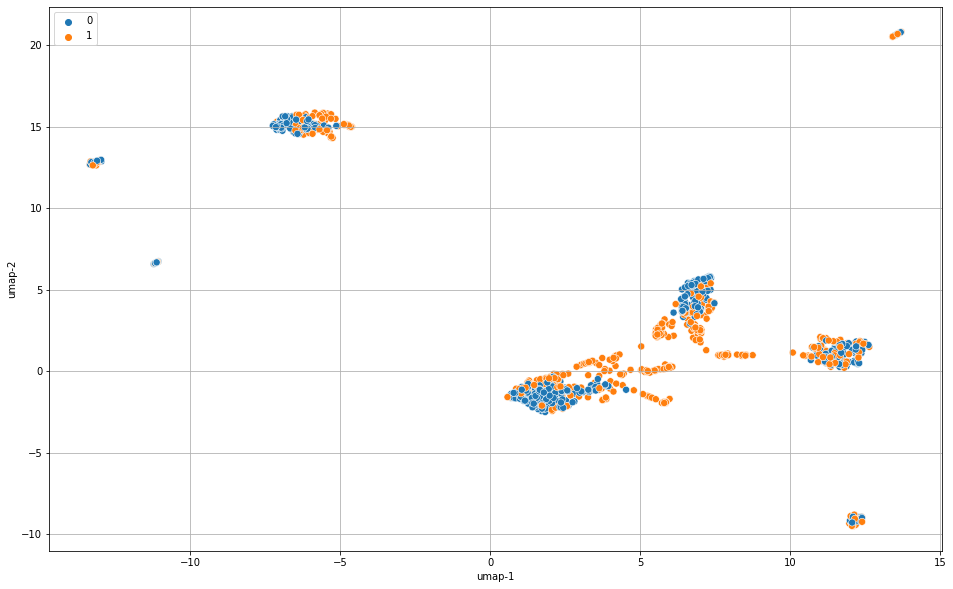

----------------------------------------------------------------------------
correlation


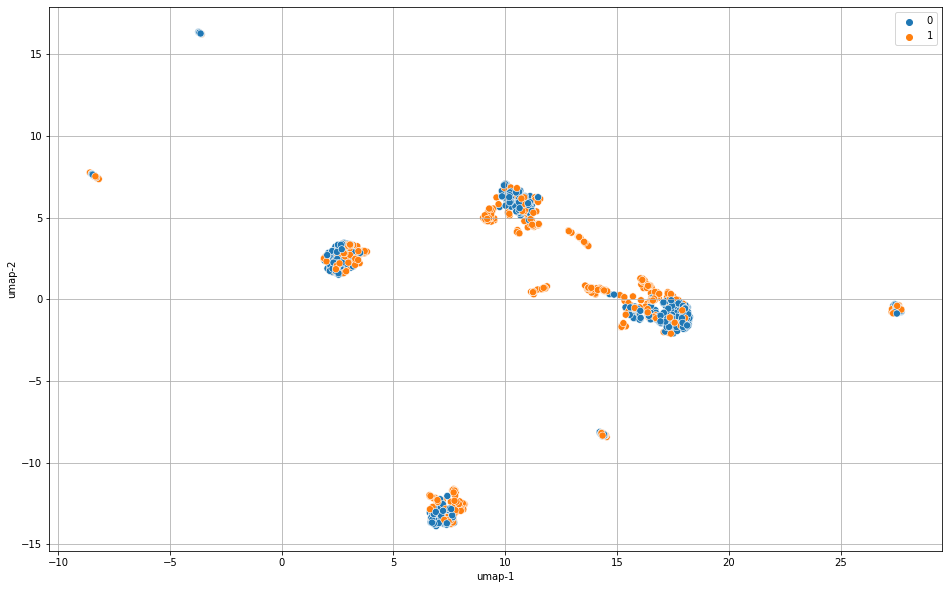

----------------------------------------------------------------------------
haversine
haversine is only defined for 2 dimensional data
----------------------------------------------------------------------------
hamming


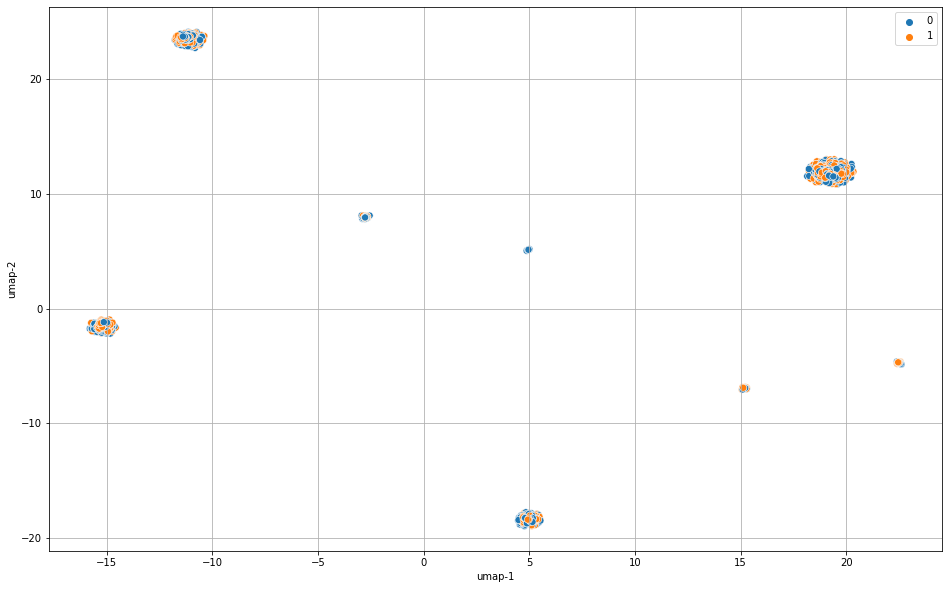

----------------------------------------------------------------------------
jaccard


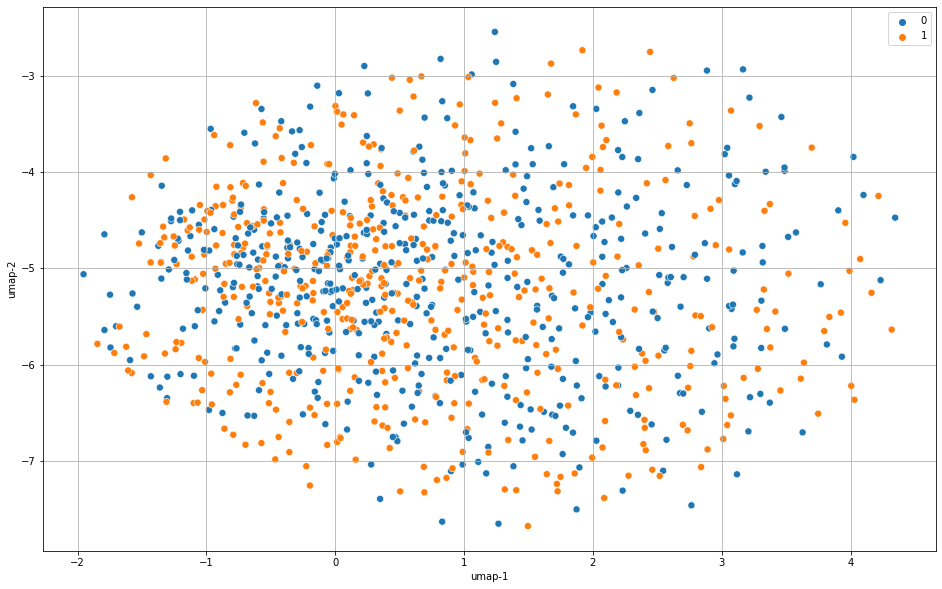

----------------------------------------------------------------------------
dice


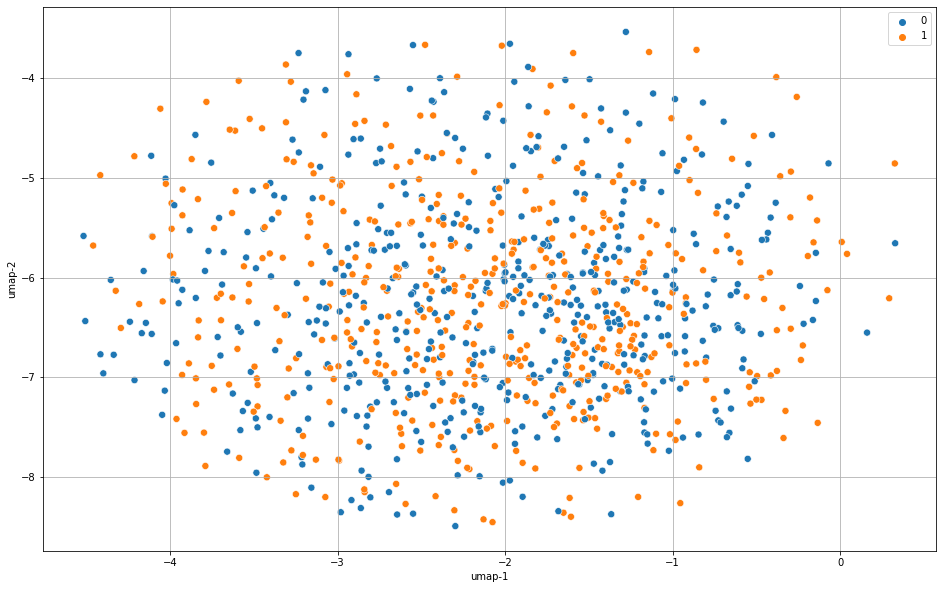

----------------------------------------------------------------------------
russelrao
metric is neither callable nor a recognised string
----------------------------------------------------------------------------
kulsinski


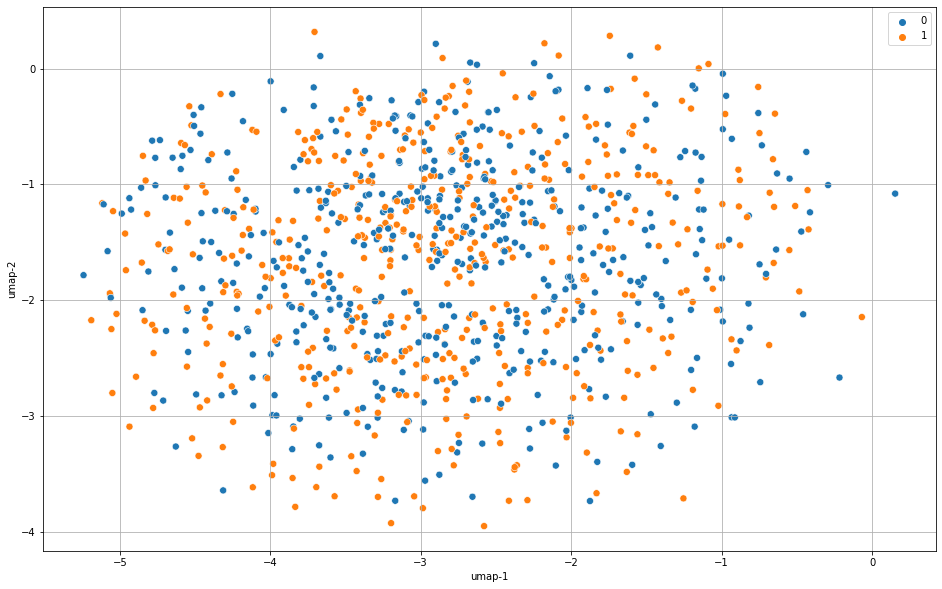

----------------------------------------------------------------------------
ll_dirichlet


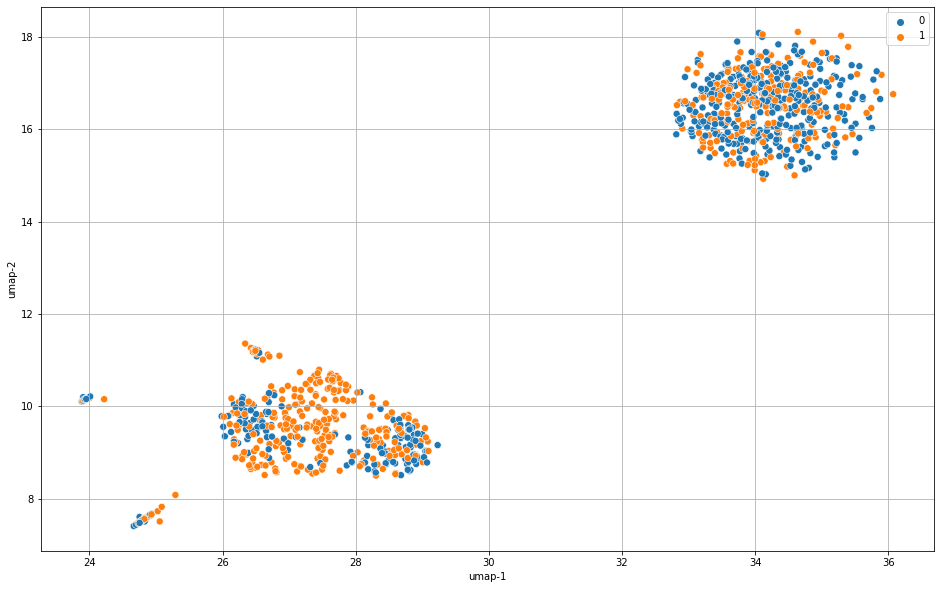

----------------------------------------------------------------------------
hellinger
Metric 'hellinger' does not support negative values
----------------------------------------------------------------------------
rogerstanimoto


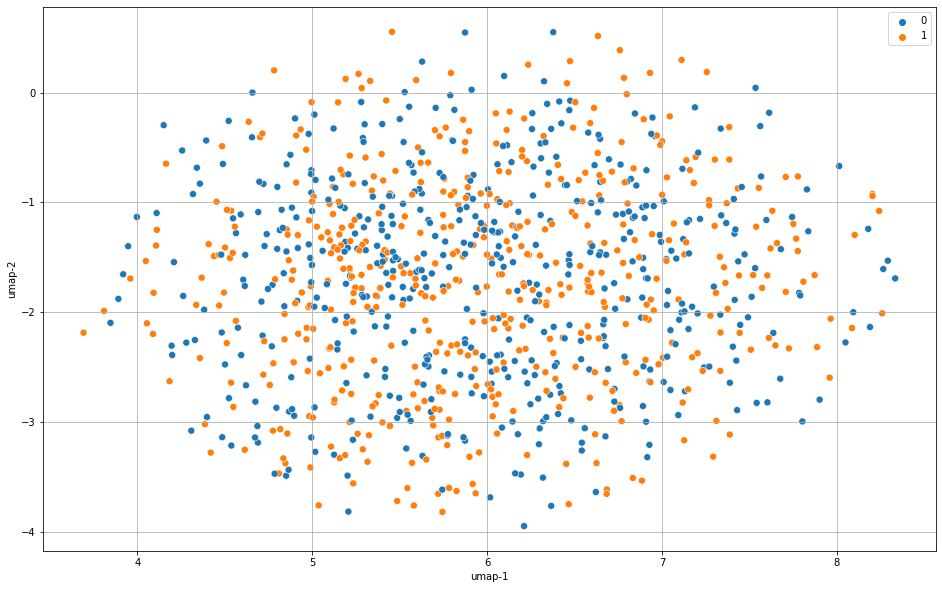

----------------------------------------------------------------------------
sokalmichener


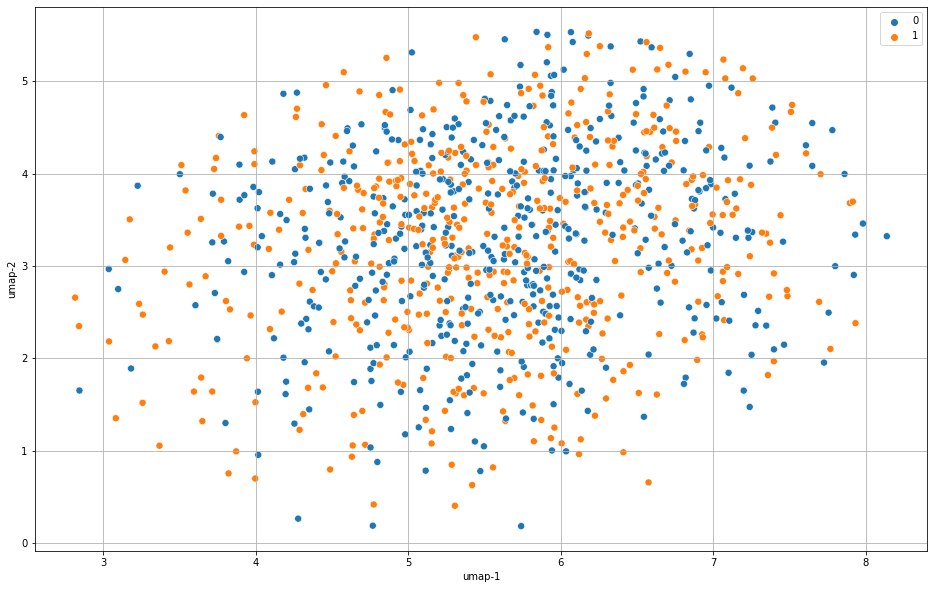

----------------------------------------------------------------------------
sokalsneath


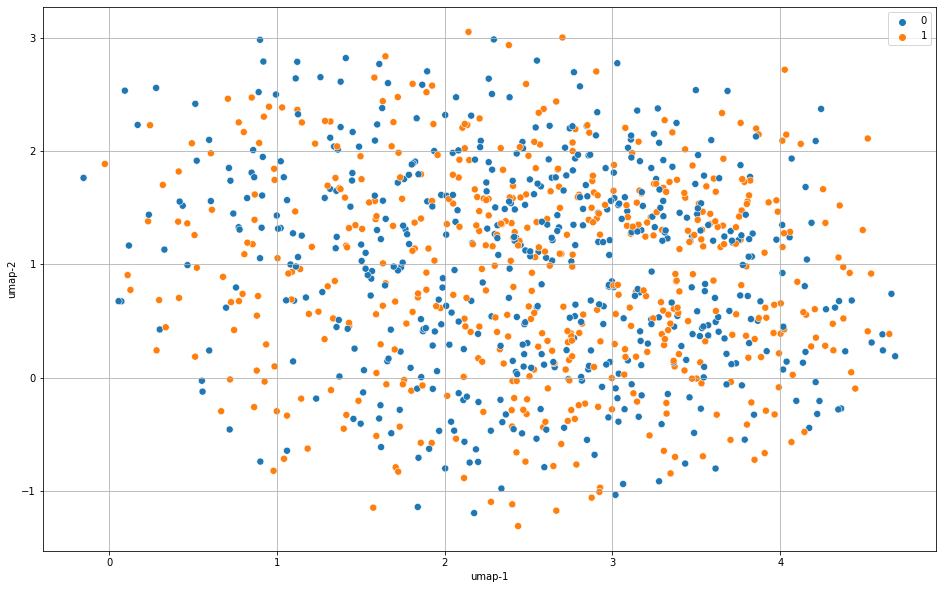

----------------------------------------------------------------------------
yule


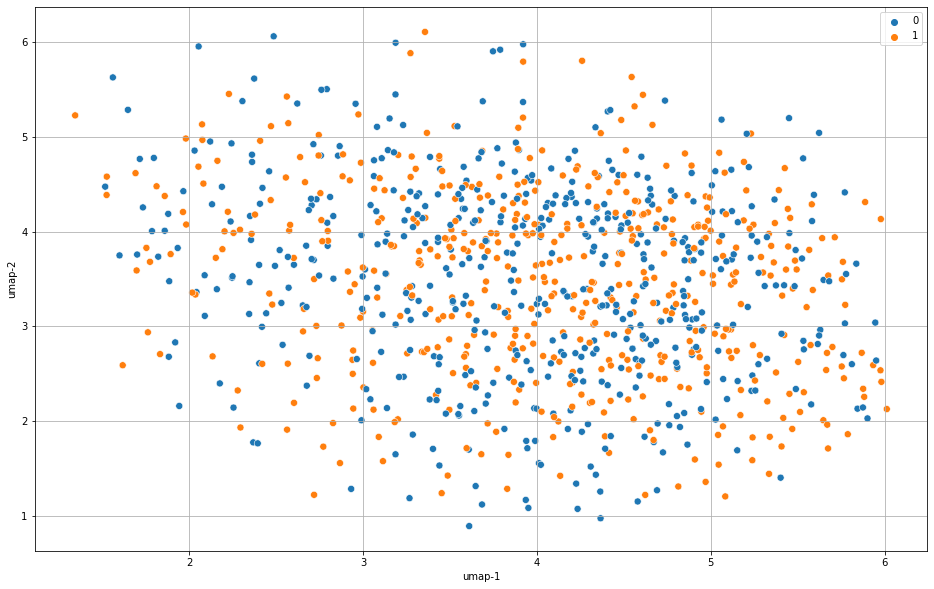

----------------------------------------------------------------------------


In [29]:
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
X_scaled = StandardScaler().fit_transform(X)
# X_scaled = np.copy(X)
target = y
print(X.shape, y.shape)
for metric in ['euclidean','manhattan','chebyshev','minkowski','canberra','braycurtis','mahalanobis','wminkowski','seuclidean','cosine','correlation','haversine','hamming','jaccard','dice','russelrao','kulsinski','ll_dirichlet','hellinger','rogerstanimoto','sokalmichener','sokalsneath','yule']:
    try:
        print(metric)
        X_umap_2D = umap.UMAP(n_components=2,
                              n_neighbors=30,
                              min_dist=0.1,
                              metric=metric).fit_transform(X_scaled)
#         X_umap_3D = umap.UMAP(n_components=3,
#                               n_neighbors=15,
#                               min_dist=0.1,
#                               metric=metric).fit_transform(X_scaled)
        plot2D(X_umap_2D, x='umap-1', y='umap-2', labels=target)
#         plot3D(X_umap_3D, x='umap-1', y='umap-2', z='umap-3', labels=target)
    except Exception as e:
        print(e)
    finally:
        print('----------------------------------------------------------------------------')

# PCA Explained Variance

Using diffs
(1008, 20)
[0.24525 0.08968 0.08329 0.06827 0.06417 0.05869 0.05361 0.05221 0.05135
 0.0456  0.04085 0.03325 0.02526 0.02278 0.02177 0.0167  0.01362 0.00912
 0.00452 0.     ]
[0.24525 0.33493 0.41822 0.48649 0.55066 0.60935 0.66297 0.71518 0.76653
 0.81213 0.85297 0.88622 0.91148 0.93427 0.95603 0.97274 0.98636 0.99548
 1.      1.     ]


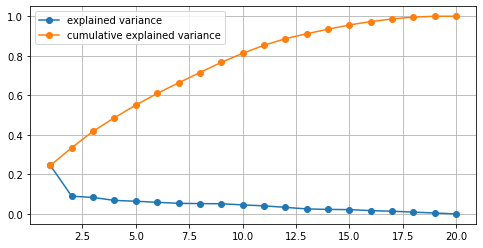

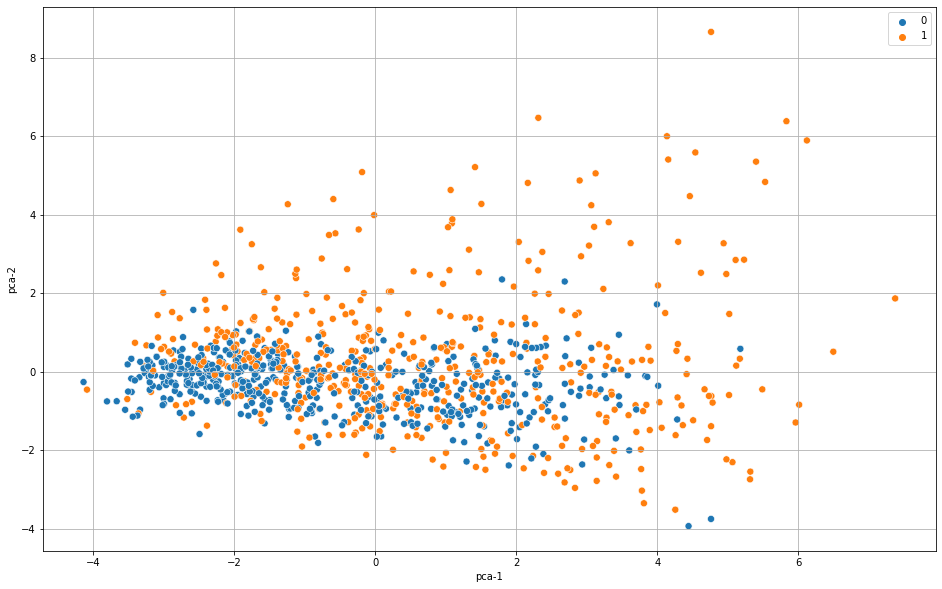

In [9]:
# X, y = read_features(path_csv, trigger_type_aux_str='polygon', arch='densenet', data='diffs')
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
print(X.shape)
X_scaled = StandardScaler().fit_transform(X)
# X_scaled = np.copy(X)

n_comps = X.shape[1]
pca = PCA(n_components=n_comps)
pca_df = pca.fit_transform(X_scaled)
totalVariance = sum(pca.explained_variance_)
explainedVariance = pca.explained_variance_ / totalVariance
cumSumExplainedVariance = np.cumsum(explainedVariance)

print(explainedVariance)
print(cumSumExplainedVariance)

indices = list(range(1, n_comps + 1))
fig = plt.figure(figsize=(8, 4))
fig.patch.set_color('white')
ax = fig.add_subplot(1, 1, 1)
ax.plot(indices, explainedVariance, 'o-')
ax.plot(indices, cumSumExplainedVariance, 'o-')
ax.legend(['explained variance', 'cumulative explained variance'])
ax.grid()

X_pca_2D = PCA(n_components=2).fit_transform(X_scaled)
X_pca_3D = PCA(n_components=3).fit_transform(X_scaled)

plot2D(X_pca_2D, x='pca-1', y='pca-2', labels=y)
plot3D(X_pca_3D, x='pca-1', y='pca-2', z='pca-3', labels=y)

# K-Means

In [31]:
X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)
   
for n_cluster in range(2, 21):
    kmeans = KMeans(n_clusters=n_cluster).fit(X)
    label = kmeans.labels_
    sil_coeff = silhouette_score(X, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

Using diffs
For n_clusters=2, The Silhouette Coefficient is 0.3175840908081231
For n_clusters=3, The Silhouette Coefficient is 0.2424716527035921
For n_clusters=4, The Silhouette Coefficient is 0.23785664566156295
For n_clusters=5, The Silhouette Coefficient is 0.20894941351457774
For n_clusters=6, The Silhouette Coefficient is 0.21499147354506196
For n_clusters=7, The Silhouette Coefficient is 0.16726142694098906
For n_clusters=8, The Silhouette Coefficient is 0.16848152720859205
For n_clusters=9, The Silhouette Coefficient is 0.17094253821365474
For n_clusters=10, The Silhouette Coefficient is 0.178507432406491
For n_clusters=11, The Silhouette Coefficient is 0.17730699741518782
For n_clusters=12, The Silhouette Coefficient is 0.1708672443629568
For n_clusters=13, The Silhouette Coefficient is 0.18071276831962538
For n_clusters=14, The Silhouette Coefficient is 0.17416085837748438
For n_clusters=15, The Silhouette Coefficient is 0.1804806171150463
For n_clusters=16, The Silhouette Co

Automatically created module for IPython interactive environment
Using diffs
For n_clusters = 2 The average silhouette_score is : 0.3175840908081231
For n_clusters = 3 The average silhouette_score is : 0.2424716527035921
For n_clusters = 4 The average silhouette_score is : 0.24348757245536853
For n_clusters = 5 The average silhouette_score is : 0.20590263884090404
For n_clusters = 6 The average silhouette_score is : 0.21611309131050935
For n_clusters = 7 The average silhouette_score is : 0.16621360032630922
For n_clusters = 8 The average silhouette_score is : 0.17915965880851528
For n_clusters = 9 The average silhouette_score is : 0.1736546404741046
For n_clusters = 10 The average silhouette_score is : 0.17014010505528843
For n_clusters = 11 The average silhouette_score is : 0.17313676595831318
For n_clusters = 12 The average silhouette_score is : 0.16255019382963193
For n_clusters = 13 The average silhouette_score is : 0.17600952554722335
For n_clusters = 14 The average silhouette_sco

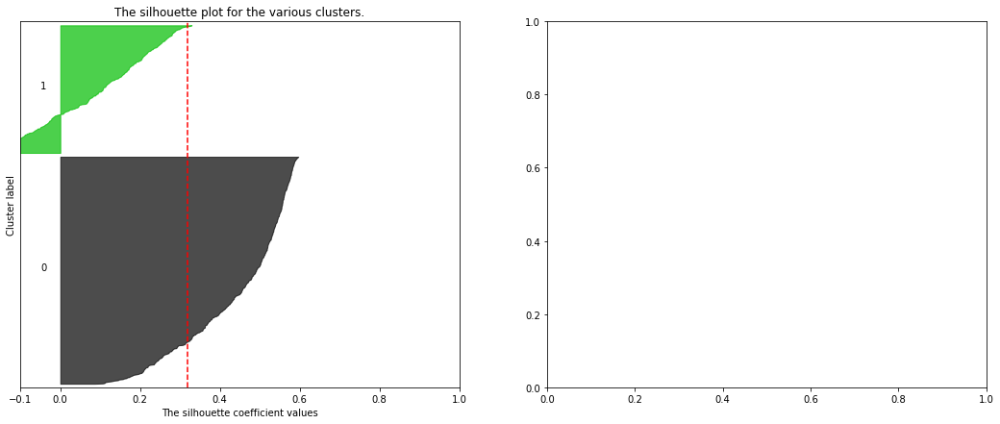

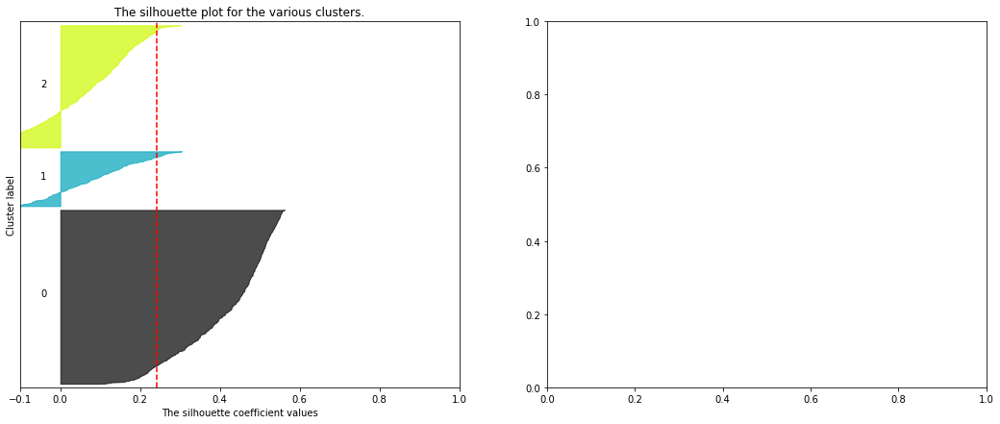

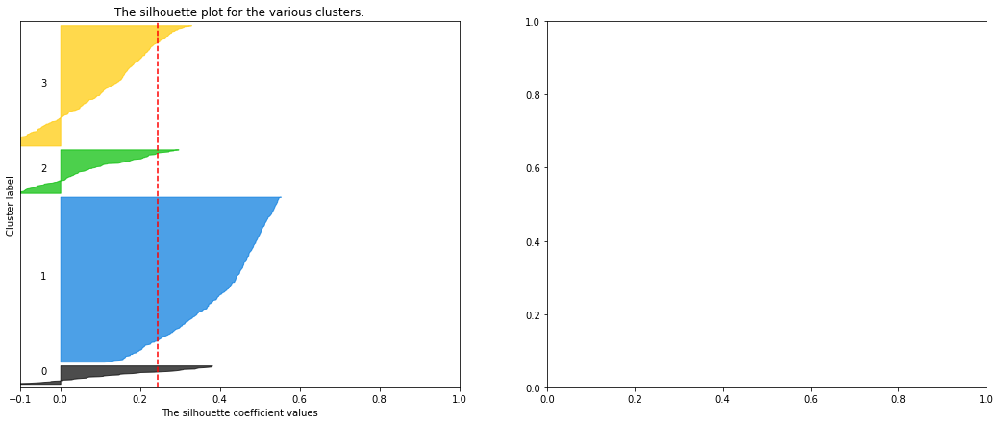

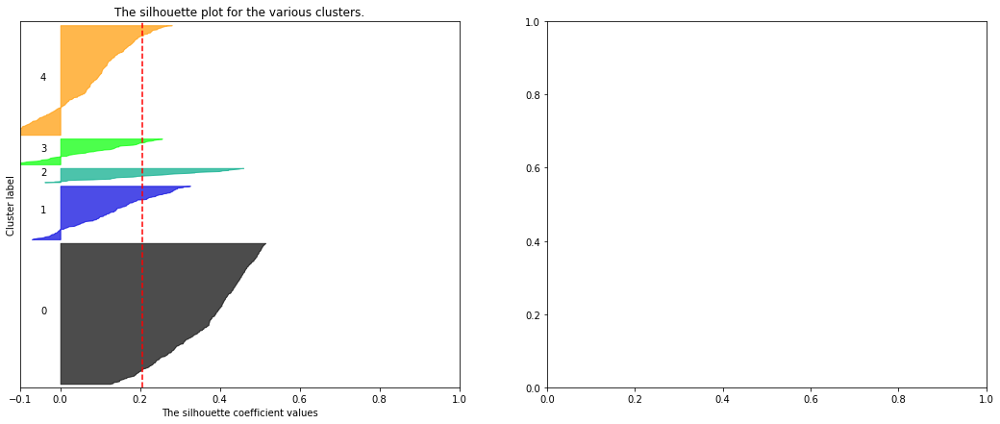

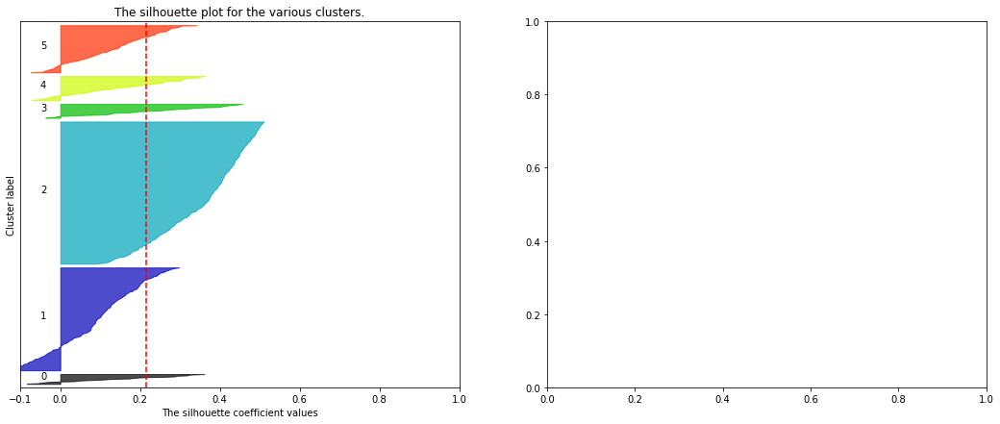

...

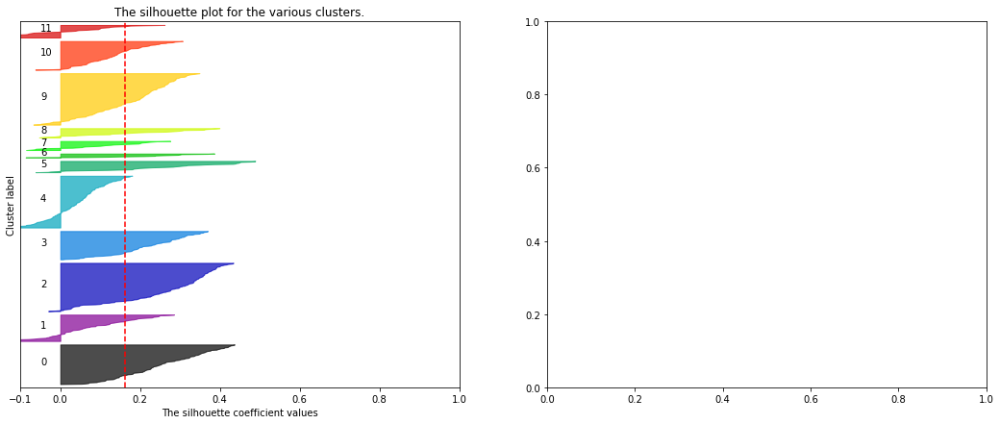

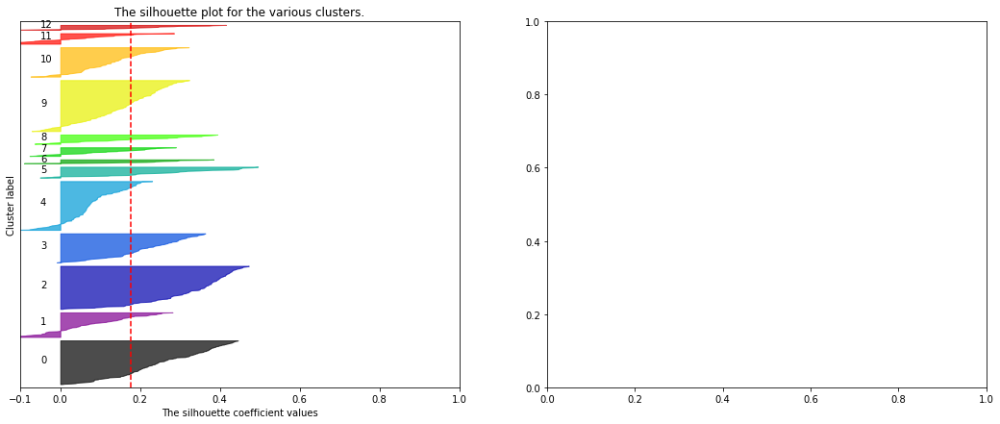

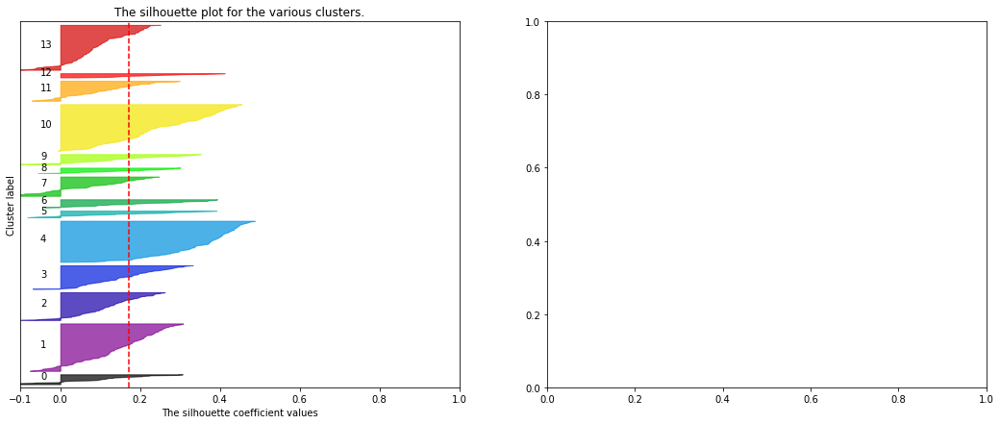

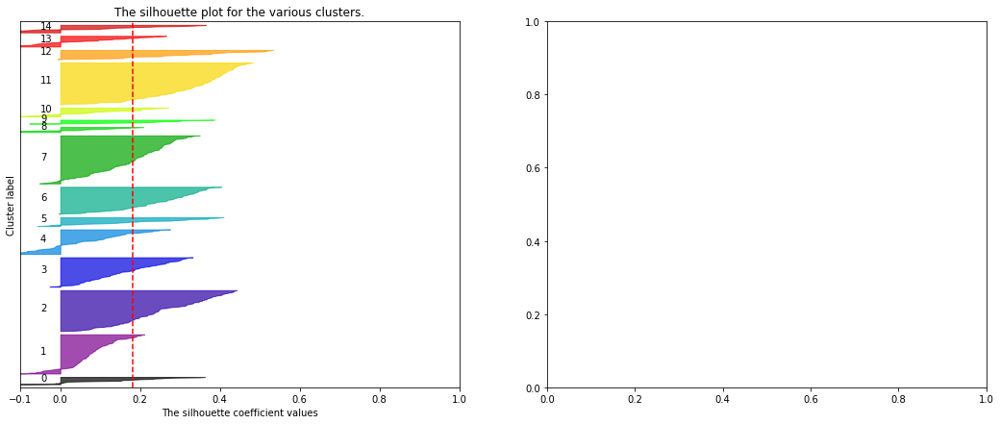

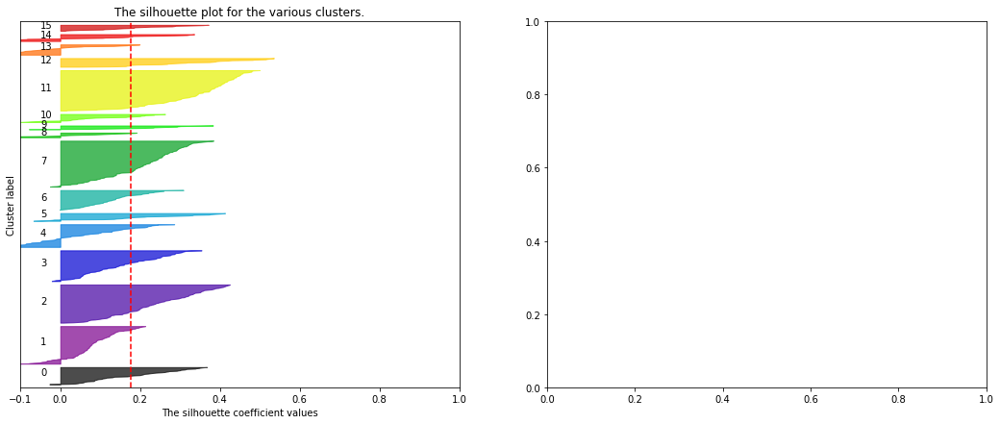

In [36]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

X, y = read_features(path_csv, trigger_type_aux_str=None, arch=None, data='diffs', append_arch=True)

range_n_clusters = list(range(2, 17))

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     # 2nd Plot showing the actual clusters formed
#     colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
#     ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
#                 c=colors, edgecolor='k')

#     # Labeling the clusters
#     centers = clusterer.cluster_centers_
#     # Draw white circles at cluster centers
#     ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
#                 c="white", alpha=1, s=200, edgecolor='k')

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
#                     s=50, edgecolor='k')

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

#     plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
#                   "with n_clusters = %d" % n_clusters),
#                  fontsize=14, fontweight='bold')

plt.show()